# OCR Annotation

Annotate ground truth text cho phần OCR evaluation.

**Chiến lược**:
1. Lọc ảnh có **IoU ≥ 0.7** từ `results.csv`.
2. Crop **vùng cố định** trên mỗi ảnh warped đã lọc.
3. Người dùng gõ lại text trong vùng đó.

## Cách chạy
1. Cell 1–3: setup paths + lọc ảnh theo IoU
2. Cell 4: preview tất cả ảnh đã crop
3. Cell 5–6: gõ ground truth + lưu JSON
4. Cell 7: rà soát lại

In [ ]:
import json
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

## 1. Đọc data từ kaggle

In [ ]:
import os
from google.colab import files


!rm -rf ~/.cache/kaggle
!rm -rf /content/dataset

!kaggle datasets download -d tiendq/scanner --force
!unzip -q scanner.zip -d /content

In [ ]:
from pathlib import Path

IMAGE_DIR = Path('/content/dataset/test')

EVAL_DIR = Path('/content/dataset/test/eval_run')
WARPED_DIR = EVAL_DIR / 'warped'
TRANSFORMS_DIR = EVAL_DIR / 'transforms'
RESULTS_CSV = EVAL_DIR / 'results.csv'
OCR_GT_PATH = EVAL_DIR / 'ocr_gt.json'

IOU_THRESHOLD = 0.70

CROP_REGION = (0.05, 0.06, 0.95, 0.16)

print('EVAL_DIR  :', EVAL_DIR)
print('IOU >=    :', IOU_THRESHOLD)
print('CROP      :', CROP_REGION)

## 2. Đọc data từ drive

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# EVAL_DIR = Path('/content/drive/MyDrive/CV/pr/dataset/test/eval_run')
# WARPED_DIR = EVAL_DIR / 'warped'
# TRANSFORMS_DIR = EVAL_DIR / 'transforms'
# RESULTS_CSV = EVAL_DIR / 'results.csv'
# OCR_GT_PATH = EVAL_DIR / 'ocr_gt.json'

# IOU_THRESHOLD = 0.70

# CROP_REGION = (0.05, 0.06, 0.95, 0.16)

# print('EVAL_DIR  :', EVAL_DIR)
# print('IOU >=    :', IOU_THRESHOLD)
# print('CROP      :', CROP_REGION)

EVAL_DIR  : /content/drive/MyDrive/CV/pr/dataset/test/test_detection/eval_run
IOU >=    : 0.7
CROP      : (0.05, 0.06, 0.95, 0.16)


## 3. Lọc ảnh có IoU ≥ ngưỡng

In [ ]:
df = pd.read_csv(RESULTS_CSV)
print(f'Tổng số dòng trong results.csv : {len(df)}')

# Lọc: detect được + có IoU + IoU >= ngưỡng
mask = df['detected'] & df['iou'].notna() & (df['iou'] >= IOU_THRESHOLD)
df_ok = df[mask].sort_values('iou', ascending=False).reset_index(drop=True)

print(f'Ảnh có IoU ≥ {IOU_THRESHOLD}        : {len(df_ok)}')
print()
print(df_ok[['image', 'iou', 'dice', 'corner_err_px']].to_string(index=False))

# Danh sách stem để annotate
selected_stems = [Path(name).stem for name in df_ok['image'].tolist()]

Tổng số dòng trong results.csv : 25
Ảnh có IoU ≥ 0.7        : 18

                                              image    iou   dice  corner_err_px
z7851999355829_5ac1fa3e6f689a207d57d3d6aa3f4f26.jpg 0.9740 0.9868          10.20
z7714827126923_eae0e9ca0d0f0cf1c6d55775a0f932fd.jpg 0.9670 0.9832          11.56
z7714827138018_2c6a64a819a53f7c09698670d1d0c3c3.jpg 0.9617 0.9805          12.41
z7714827142264_5ac4f8f41b14a8f38425b0c2e7bf576e.jpg 0.9617 0.9805          12.64
z7714827176964_651ecba060792771a088a276a71224c6.jpg 0.8932 0.9436          33.70
       2aOboQY0LBwLs4o8LQpYJ31H0OSflP7tBBHsTLTE.jpg 0.8827 0.9377          94.62
       2aOboQY0LEFxDH3abPqjshfixAFuRAaJTAJ5BjiC.jpg 0.8751 0.9334          97.70
       2aOboQY0L8fcafZOXWcTbRm76XS8xGc87Tpt8AcK.jpg 0.8624 0.9261         109.11
z7722644494144_618dbae640d2900065f958d6f88df977.jpg 0.8110 0.8956          80.33
       2aOboQY0LDAJOlk2pQzOZbYRrjRjcGF3huCPCQ1g.jpg 0.8051 0.8920         172.26
       2aOboQY0LCLhKr51VZSxcnN0NlDHNyBOZlwp

## 4. Preview ảnh đã crop

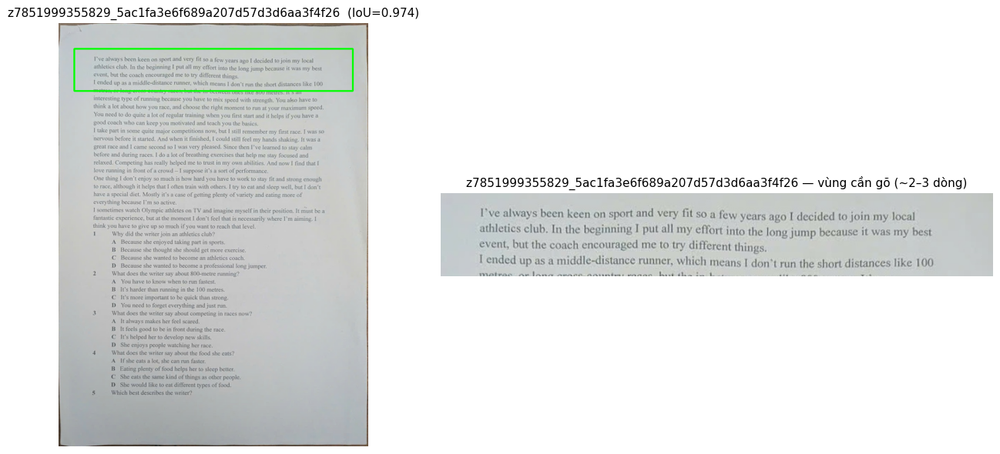

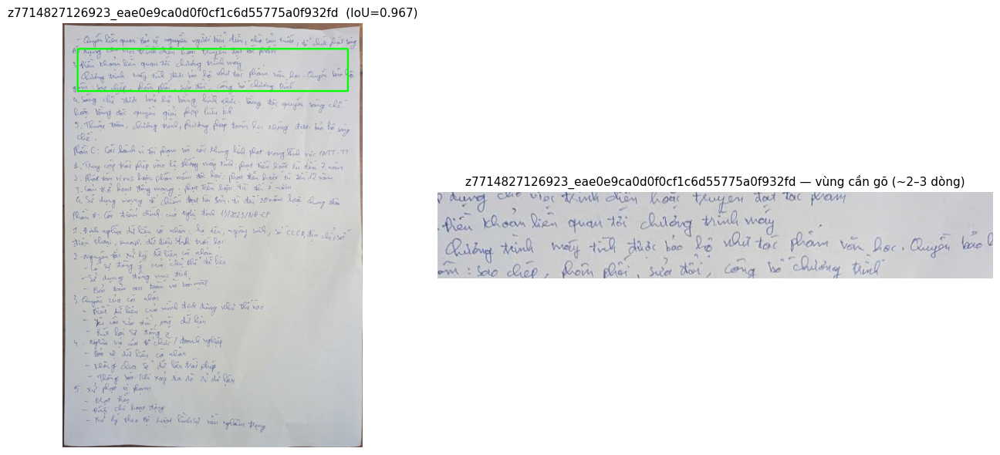

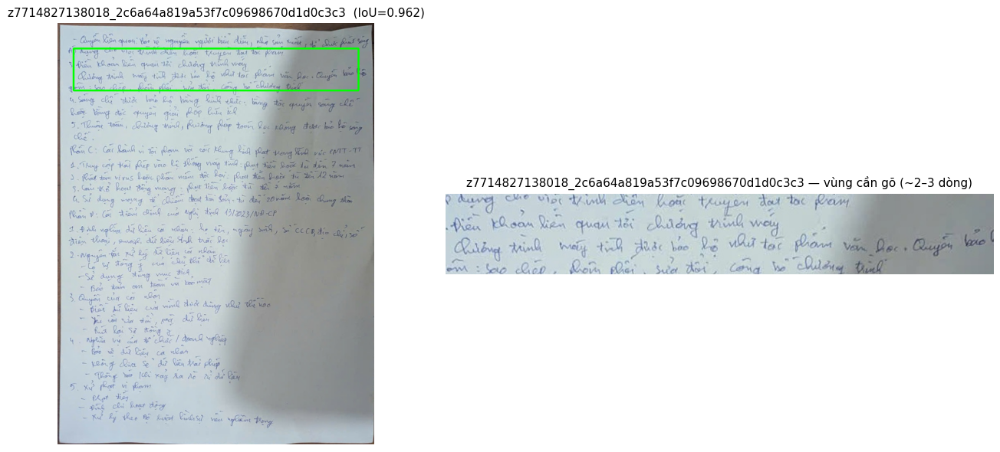

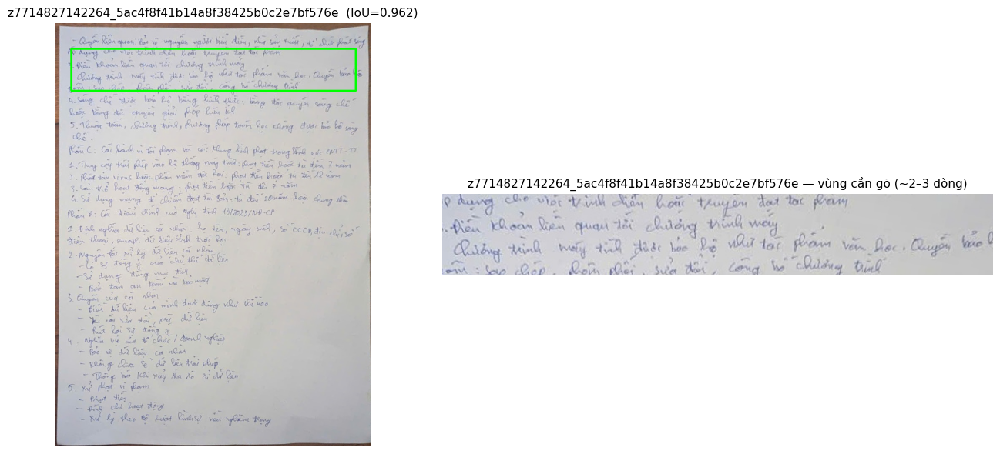

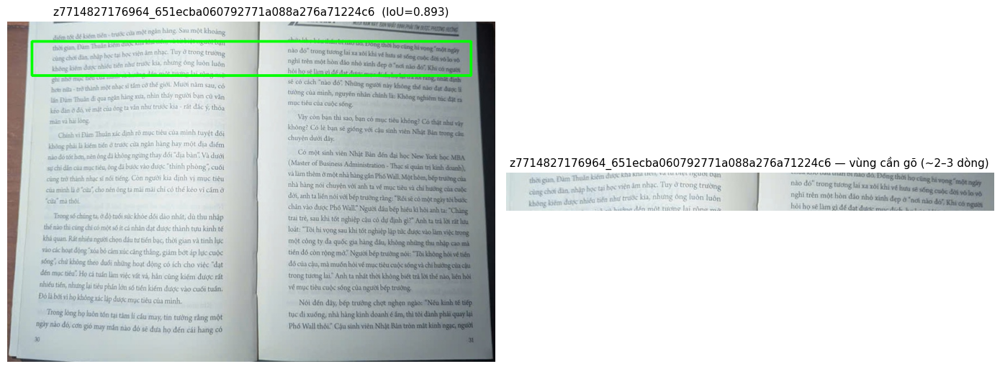

...

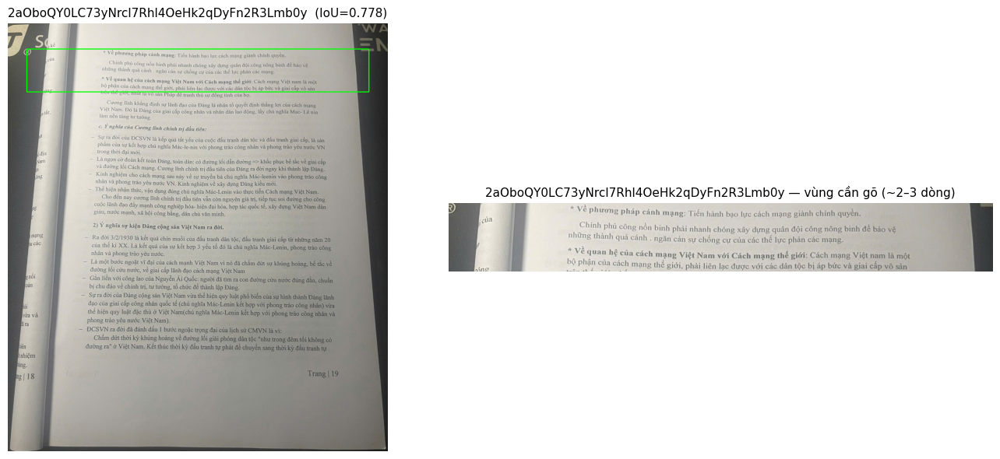

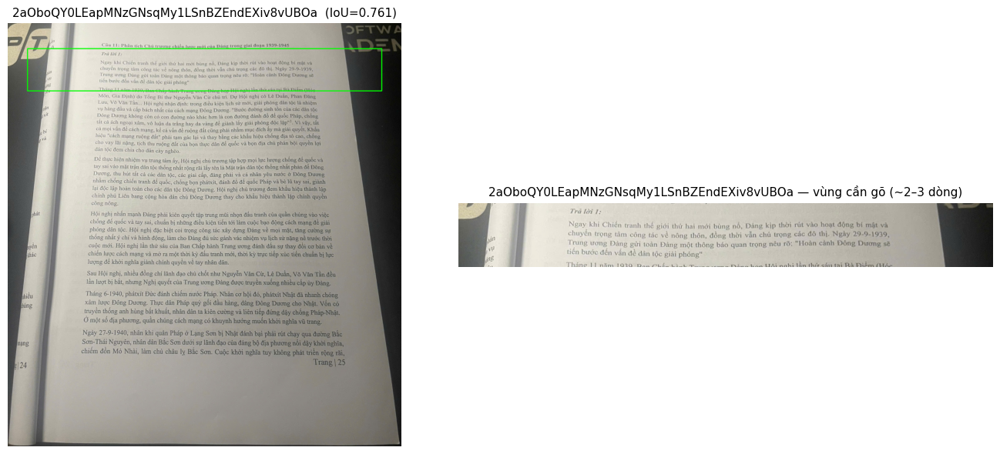

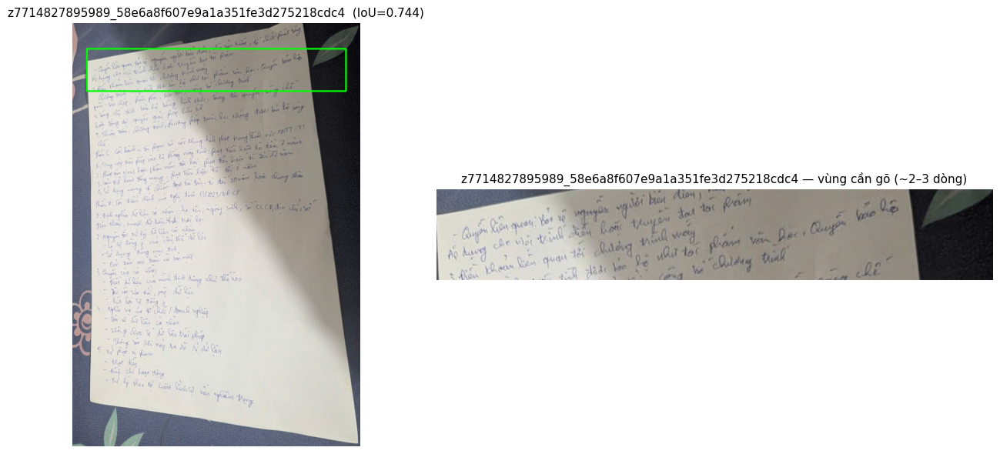

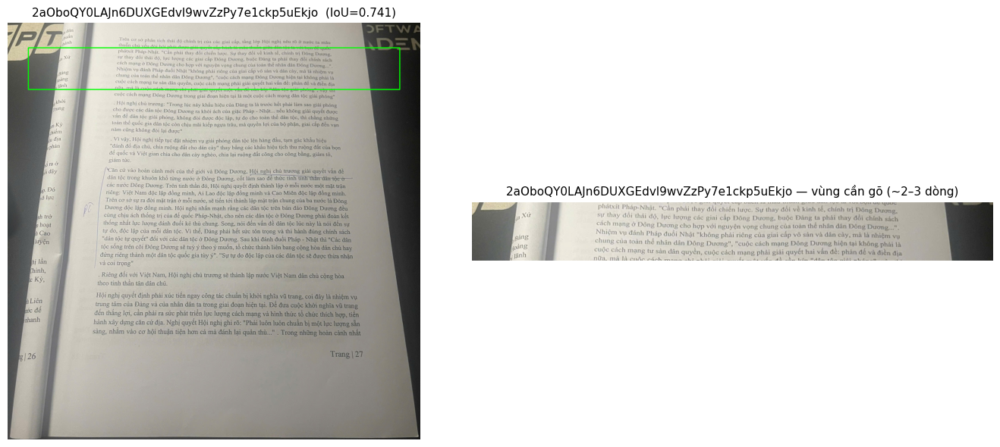

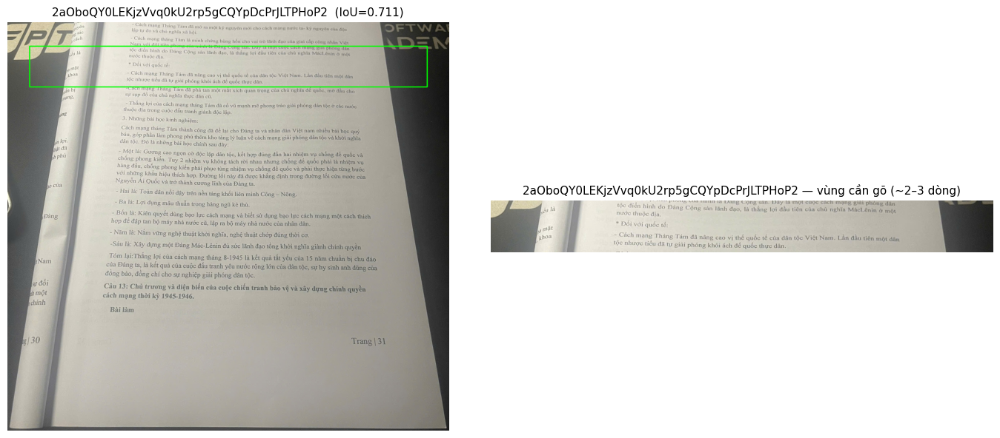

In [ ]:
def crop_by_ratio(img, region):
    """Crop ảnh theo tỷ lệ (x0, y0, x1, y1) ∈ [0,1]."""
    h, w = img.shape[:2]
    x0, y0, x1, y1 = region
    x0p, x1p = int(round(x0 * w)), int(round(x1 * w))
    y0p, y1p = int(round(y0 * h)), int(round(y1 * h))
    return img[y0p:y1p, x0p:x1p], (x0p, y0p, x1p, y1p)


for stem in selected_stems:
    warped_path = WARPED_DIR / f'{stem}.jpg'
    img = cv2.imread(str(warped_path))
    if img is None:
        print(f'[skip] {stem}: không đọc được ảnh warped')
        continue

    cropped, (x0, y0, x1, y1) = crop_by_ratio(img, CROP_REGION)

    overlay = img.copy()
    cv2.rectangle(overlay, (x0, y0), (x1, y1), (0, 255, 0), 4)

    iou_val = float(df_ok.loc[df_ok['image'].str.startswith(stem), 'iou'].iloc[0])

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    axes[0].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f'{stem}  (IoU={iou_val:.3f})', fontsize=11)
    axes[0].axis('off')
    axes[1].imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f'{stem} — vùng cần gõ (~2–3 dòng)', fontsize=11)
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

## 5. Gõ ground truth text

Cell dưới in template `GROUND_TRUTH = {...}`. Copy ra cell tiếp theo và điền text trong vùng crop tương ứng từng ảnh.

**Quy tắc gõ**:
- Gõ **tất cả chữ trong vùng crop** (không thêm, không bớt)
- Giữ chữ hoa/thường
- Tiếng Việt: gõ đầy đủ dấu
- Vùng không có chữ rõ → để chuỗi rỗng `''` để bỏ qua ảnh đó

In [ ]:
# Sinh template, giữ lại text đã gõ trước đó nếu có file cũ
if OCR_GT_PATH.exists():
    with open(OCR_GT_PATH, encoding='utf-8') as f:
        existing = json.load(f).get('items', {})
else:
    existing = {}

print('# === Copy cell dưới và điền value cho từng key ===')
print('GROUND_TRUTH = {')
for stem in selected_stems:
    text = existing.get(stem, {}).get('ground_truth', '')
    safe = text.replace('\\', '\\\\').replace('"', '\\"').replace('\n', '\\n')
    print(f'    "{stem}": "{safe}",')
print('}')

# === Copy cell dưới và điền value cho từng key ===
GROUND_TRUTH = {
    "z7851999355829_5ac1fa3e6f689a207d57d3d6aa3f4f26": "",
    "z7714827126923_eae0e9ca0d0f0cf1c6d55775a0f932fd": "",
    "z7714827138018_2c6a64a819a53f7c09698670d1d0c3c3": "",
    "z7714827142264_5ac4f8f41b14a8f38425b0c2e7bf576e": "",
    "z7714827176964_651ecba060792771a088a276a71224c6": "",
    "2aOboQY0LBwLs4o8LQpYJ31H0OSflP7tBBHsTLTE": "",
    "2aOboQY0LEFxDH3abPqjshfixAFuRAaJTAJ5BjiC": "",
    "2aOboQY0L8fcafZOXWcTbRm76XS8xGc87Tpt8AcK": "",
    "z7722644494144_618dbae640d2900065f958d6f88df977": "",
    "2aOboQY0LDAJOlk2pQzOZbYRrjRjcGF3huCPCQ1g": "",
    "2aOboQY0LCLhKr51VZSxcnN0NlDHNyBOZlwpWIAS": "",
    "2aOboQY0LD3AfEN3DducwGDzfbjAeH5WaCcjBvxQ": "",
    "2aOboQY0LCyr4qnLqnlc5BV3WBOvcFJOiii2I2zY": "",
    "2aOboQY0LC73yNrcl7Rhl4OeHk2qDyFn2R3Lmb0y": "",
    "2aOboQY0LEapMNzGNsqMy1LSnBZEndEXiv8vUBOa": "",
    "z7714827895989_58e6a8f607e9a1a351fe3d275218cdc4": "",
    "2aOboQY0LAJn6DUXGEdvl9wvZzPy7e1ckp5uEkjo": ""

In [ ]:
# === Điền ground truth text vào dict này ===
# Copy template từ cell trên, thay phần value bằng text trong vùng crop.
# Ví dụ:
# GROUND_TRUTH = {
#     "IMG_001": "Chương 1: Giới thiệu\nNgôn ngữ Python",
#     "IMG_002": "",  # bỏ qua, vùng crop không có text rõ
# }

GROUND_TRUTH = {
    "z7851999355829_5ac1fa3e6f689a207d57d3d6aa3f4f26": "I’ve always been keen on sport and very fit so a few years ago I decided to join my local athletics club. In the beginning I put all my effort into the long jump becasue it was my best avent, but the coach encouraged me to try different things. I ended up as a middle-distance runner, which means I don’t run the short distances like 100",
    "z7714827126923_eae0e9ca0d0f0cf1c6d55775a0f932fd": "Điều khoản liên quan tới chương trình máy chương trình máy tính được bảo hộ như tác phẩm văn học. Quyền bảo âm: sao chép, phân phối, sửa đổi, công bố chương trình",
    "z7714827138018_2c6a64a819a53f7c09698670d1d0c3c3": "Điều khoản liên quan tới chương trình máy chương trình máy tính được bảo hộ như tác phẩm văn học. Quyền bảo âm: sao chép, phân phối, sửa đổi, công bố chương trình",
    "z7714827142264_5ac4f8f41b14a8f38425b0c2e7bf576e": "Điều khoản liên quan tới chương trình máy chương trình máy tính được bảo hộ như tác phẩm văn học. Quyền bảo âm: sao chép, phân phối, sửa đổi, công bố chương trình",
    "z7714827176964_651ecba060792771a088a276a71224c6": "Thời gian Đầm thuận kiếm được. Đồng thời họ cũng hi vọng “một ngày cùng chơi đàn, nhập học tại viện âm nhạc. Tuy ở trong trường nào đó” trong tương lai xa xôi khi về hưu sẽ sống cuộc đời vô lo vô không kiếm được nhiều tiền như trước kia nhưng ông luôn luôn nghĩ một hòn đảo nhỏ xinh đẹp ở “nơi nào đo”. Khi có người hỏi họ sẽ làm gì để đạt được",
    "2aOboQY0LBwLs4o8LQpYJ31H0OSflP7tBBHsTLTE": "Output: chuyển thành thập phân ta tạo biến acc = 0 duyệt từ trái qua phải ở mỗi lần duyệt",
    "2aOboQY0LEFxDH3abPqjshfixAFuRAaJTAJ5BjiC": "Hoa – Việt thân thiện đối với quân đội Tưởng Giới Thạch và về kinh tế đối với Pháp Chỉ thị về kháng chiến kiến quốc có ý nghĩa hết sức quan trọng. Chỉ thị đã xác định đúng kẻ thù chính của dân tộc Việt Nam là thực dan Pháp xâm lược. Đã chỉ ra kịp thời những vấn đề cơ bản về lược cách mạng, nhất là nêu rõ hai nhiệm vụ chiến lược mới của cách mạng đất nước đi đôi với bảo vệ đất nước. Đề ra những đói, nạn dốt, chống giặc ngoài",
    "2aOboQY0L8fcafZOXWcTbRm76XS8xGc87Tpt8AcK": "Thực hiện kế hoạc rơve, từ tháng 6/1949 Pháp đưa nhiều vũ khó mới vào Việt Nam quân ở Nam Bộ, Trung Bộ ra Bắc, tăng cường hệ thống phòng ngự trên đường số 4, thiết lập Hành lang Đông – Tây. Trên cơ sở đó Pháp chuẩn bị một kế hoạch quy mô lớn với tiến công Việt Bắc lần thứ hai, mong giành thắng lợi, nhanh chóng kết thúc chiến tranh. Để khắc phục khó khăn đó, đưa cuộc kháng chiến phát triển lên bước mới, tháng 6/1950, Đảng và. Tiêu diệt một bộ phận quan trọng sinh có căn cứ địa",
    "z7722644494144_618dbae640d2900065f958d6f88df977": "Base PR Step compostion vào mult và S fact là PR",
    "2aOboQY0LDAJOlk2pQzOZbYRrjRjcGF3huCPCQ1g": "Tổng kết những kinh nghiệm lịch sử Đảng Khoa học lịch sử Đảng có nhiệm vụ góp phần tổng kết những kinh và không thành công của Đảng trong quá trình lãnh đạo cách mạng, góp phần làm kho tàng lý luận của Đảng",
    "2aOboQY0LCLhKr51VZSxcnN0NlDHNyBOZlwpWIAS": "Giới thiệu về chủ nghĩa xã hội và chủ nghĩa cộng sản, chủ nghĩa Tam dân là cuốn Đường Kách Mệnh của Nguyễn Ái Quốc xuất bản đầu năm 1927 trình bày một cách dễ hiểu nhất bản chất của học thuyết Mác Lênin và phương hướng yêu cầu phát triển cơ bản của cách mạng Việt Nam Từ trung tâm cách mạng Quảng Chây, tài liệu được chuyển đi Matxcơva rồi sang Paris và chuyển trực tiếp về Việt Nam. Những tư tưởng chú niệm về cách mạng xác",
    "2aOboQY0LD3AfEN3DducwGDzfbjAeH5WaCcjBvxQ": "HCM đến với học thuyết cách mạng chủ nghĩa Mác-Lênin và lựa chọn khuynh hướng chính trị vô sản.  Người khẳng định muốn cứu nước, giải phóng dân tộc không có con đường nào khác ngoài con đường cách mạng vô sản và chỉ có CNXH, CNCS mới giải phóng được dân tộc bị áp bức và",
    "2aOboQY0LCyr4qnLqnlc5BV3WBOvcFJOiii2I2zY": "Trong bối cảnh Quốc tế cộng sản đang nỗ lực tiến hành thiết lập ở Đông Dương một trung tâm tuyên truyền để gây ảnh hưởng nhung gặp phải những trở ngại do sự ngăn cấm của thực dân Pháp. Sự xuất hiện của ông Nguyễn vào kucs này như một sự lựa chọn ngẫu nhiên, đặt lên vai Ông sứ mệnh mà Ông đang mong muốn thực hiện đó là đưa chủ nghĩa Mác Lênin vào Vieeth Nam và sử dụng nhiều phương tiện thông",
    "2aOboQY0LC73yNrcl7Rhl4OeHk2qDyFn2R3Lmb0y": "Về phương pháp cách mạng: Tiến hành bạo lực cách mạng giành chính quyền Chính phủ công dồ binh phải nhanh chóng xây dựng quân đội công nông binh để bảo vệ những thành quả cánh ngăn cản sự chống cự của các thế lực phản cách mạng Về quan hệ của cách mạng Việt Nam bới Cách mạng thế giới: Cách mạng Việt Nam là một bộ phận của cách mạng thế giới, phải liên tục được với các dân tộc bị áp bức và giai cấp vô sản",
    "2aOboQY0LEapMNzGNsqMy1LSnBZEndEXiv8vUBOa": "Trả lời 1: Ngay khi Chiến tranh thế giới thứ hai mới bùng nổ, Đảng kịp thời rút vào hoạt động bí mật và chuyển trọng tâm công tác về nông thôn, đồng thời vẫn chú trọng các đô thị. Ngày 29-9-1939, trung ương Đảng gửi toàn Đảng một thông báo quan trọng nêu rõ: Hoàn cảnh Đông Dương sẽ tiến bước đến vấn đề dân tộc giải phóng",
    "z7714827895989_58e6a8f607e9a1a351fe3d275218cdc4": "Quyền liên quân: Bảo vệ nguyền người biểu Áp dụng cho một trình diễn hoặc truyền đạt tác phẩm Điều khoản kiên quan tới chương trình máy được bảo vệ như tác phẩm văn học. Quyền bảo hộ công bố chương trình",
    "2aOboQY0LAJn6DUXGEdvl9wvZzPy7e1ckp5uEkjo": "Phátxí Pháp-Nhật. Cần thay đổi chiến lược. Sự thay đổi về kinh tế, chính trị Đông Dương. Sự thay đổi thái độ, lực lượng các giai cấp Đông Dương, buộc Đảng ta phải thay đổi chính sách cách mạng ở Đông Dương cho hợp với nguyện vọng chưng của toàn thể nhân dân Đông Dương... Nhiệm vụ đánh Pháp đuổi Nhật không phải riêng của giai cấp vô sản và dân cày, mà là nhiệm vụ chung của toàn thể nhân đân Đông Dương, cuộc cách mạng Đông Dương hiện tại không phải là cuộc cách mạng tư sản dân quyền, cuộc cách mạng phải giải quyết hai vấn đề: phản đề và điền địa",
    "2aOboQY0LEKjzVvq0kU2rp5gCQYpDcPrJLTPHoP2": "Tộc điển hình do Đảng Cộng sản lãnh đạo, là thắng lợi đầu tiên của chủ nghĩa MácLênin ở nước thuộc địa Đối với quốc tế Cách mạng Tháng Tám đã nâng cao vị thế quốc tế của dân tộc Việt Nam. Lần đầu tiên một dân tộc nhược tiểu đã tự giải phòng khỏi ác đế quốc thực dân",
}

# Sanity check
non_empty = {k: v for k, v in GROUND_TRUTH.items() if v.strip()}
print(f'Đã gõ ground truth cho {len(non_empty)}/{len(GROUND_TRUTH)} ảnh')

Đã gõ ground truth cho 18/18 ảnh


## 6. Lưu JSON

File output `ocr_gt.json` có cấu trúc:
```json
{
  "crop_region": [0.05, 0.06, 0.95, 0.16],
  "iou_threshold": 0.7,
  "items": {
    "IMG_001": {
      "ground_truth": "...",
      "warped_size": [W, H],
      "crop_pixel": [x0, y0, x1, y1],
      "iou": 0.873
    }
  }
}
```

In [ ]:
items = {}
for stem, text in GROUND_TRUTH.items():
    text = text.strip()
    if not text:
        continue

    warped_path = WARPED_DIR / f'{stem}.jpg'
    if not warped_path.exists():
        print(f'[skip] {stem}: không tìm thấy warped image')
        continue

    img = cv2.imread(str(warped_path))
    h, w = img.shape[:2]
    _, crop_pixel = crop_by_ratio(img, CROP_REGION)

    iou_row = df_ok[df_ok['image'].str.startswith(stem)]
    iou_val = float(iou_row['iou'].iloc[0]) if len(iou_row) else None

    items[stem] = {
        'ground_truth': text,
        'warped_size': [int(w), int(h)],
        'crop_pixel': [int(v) for v in crop_pixel],
        'iou': iou_val,
    }

OCR_GT_PATH.parent.mkdir(parents=True, exist_ok=True)
with open(OCR_GT_PATH, 'w', encoding='utf-8') as f:
    json.dump({
        'crop_region': list(CROP_REGION),
        'iou_threshold': IOU_THRESHOLD,
        'items': items,
    }, f, ensure_ascii=False, indent=2)

print(f'Đã lưu {len(items)} ground truth → {OCR_GT_PATH}')

Đã lưu 18 ground truth → /content/drive/MyDrive/CV/pr/dataset/test/test_detection/eval_run/ocr_gt.json


## 7. Rà soát lại

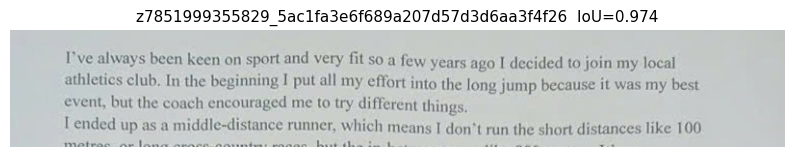

--- ground truth ---
I’ve always been keen on sport and very fit so a few years ago I decided to join my local athletics club. In the beginning I put all my effort into the long jump becasue it was my best avent, but the coach encouraged me to try different things. I ended up as a middle-distance runner, which means I don’t run the short distances like 100



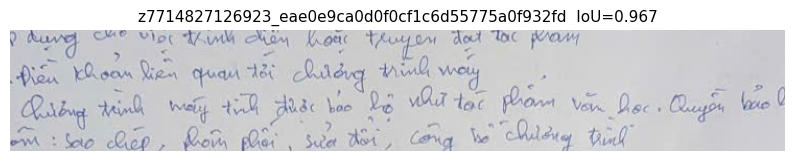

--- ground truth ---
Điều khoản liên quan tới chương trình máy chương trình máy tính được bảo hộ như tác phẩm văn học. Quyền bảo âm: sao chép, phân phối, sửa đổi, công bố chương trình



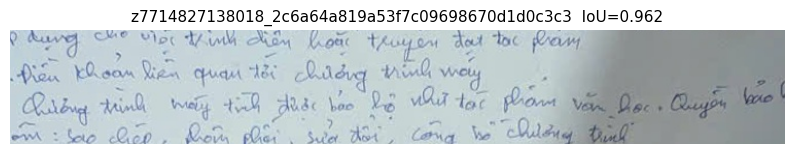

--- ground truth ---
Điều khoản liên quan tới chương trình máy chương trình máy tính được bảo hộ như tác phẩm văn học. Quyền bảo âm: sao chép, phân phối, sửa đổi, công bố chương trình



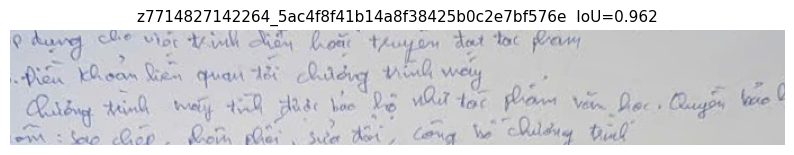

--- ground truth ---
Điều khoản liên quan tới chương trình máy chương trình máy tính được bảo hộ như tác phẩm văn học. Quyền bảo âm: sao chép, phân phối, sửa đổi, công bố chương trình



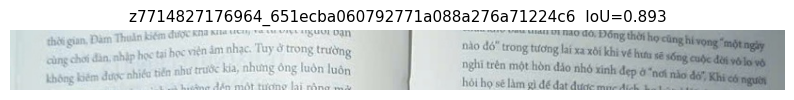

--- ground truth ---
Thời gian Đầm thuận kiếm được. Đồng thời họ cũng hi vọng “một ngày cùng chơi đàn, nhập học tại viện âm nhạc. Tuy ở trong trường nào đó” trong tương lai xa xôi khi về hưu sẽ sống cuộc đời vô lo vô không kiếm được nhiều tiền như trước kia nhưng ông luôn luôn nghĩ một hòn đảo nhỏ xinh đẹp ở “nơi nào đo”. Khi có người hỏi họ sẽ làm gì để đạt được



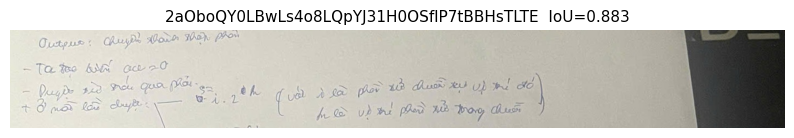

--- ground truth ---
Output: chuyển thành thập phân ta tạo biến acc = 0 duyệt từ trái qua phải ở mỗi lần duyệt



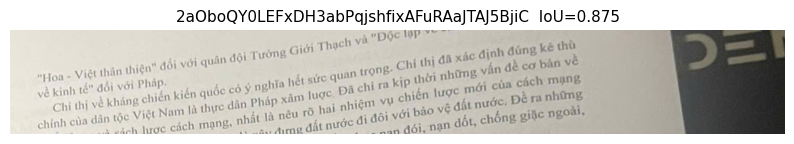

--- ground truth ---
Hoa – Việt thân thiện đối với quân đội Tưởng Giới Thạch và về kinh tế đối với Pháp Chỉ thị về kháng chiến kiến quốc có ý nghĩa hết sức quan trọng. Chỉ thị đã xác định đúng kẻ thù chính của dân tộc Việt Nam là thực dan Pháp xâm lược. Đã chỉ ra kịp thời những vấn đề cơ bản về lược cách mạng, nhất là nêu rõ hai nhiệm vụ chiến lược mới của cách mạng đất nước đi đôi với bảo vệ đất nước. Đề ra những đói, nạn dốt, chống giặc ngoài



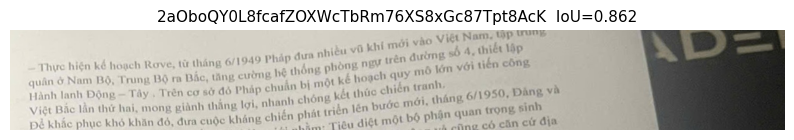

--- ground truth ---
Thực hiện kế hoạc rơve, từ tháng 6/1949 Pháp đưa nhiều vũ khó mới vào Việt Nam quân ở Nam Bộ, Trung Bộ ra Bắc, tăng cường hệ thống phòng ngự trên đường số 4, thiết lập Hành lang Đông – Tây. Trên cơ sở đó Pháp chuẩn bị một kế hoạch quy mô lớn với tiến công Việt Bắc lần thứ hai, mong giành thắng lợi, nhanh chóng kết thúc chiến tranh. Để khắc phục khó khăn đó, đưa cuộc kháng chiến phát triển lên bước mới, tháng 6/1950, Đảng và. Tiêu diệt một bộ phận quan trọng sinh có căn cứ địa



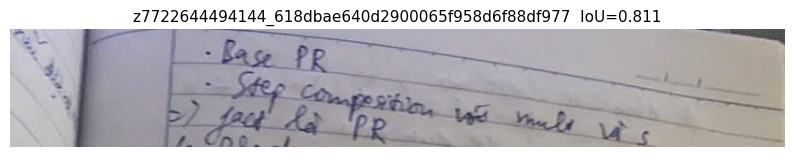

--- ground truth ---
Base PR Step compostion vào mult và S fact là PR



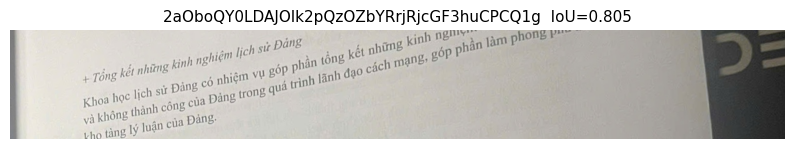

--- ground truth ---
Tổng kết những kinh nghiệm lịch sử Đảng Khoa học lịch sử Đảng có nhiệm vụ góp phần tổng kết những kinh và không thành công của Đảng trong quá trình lãnh đạo cách mạng, góp phần làm kho tàng lý luận của Đảng



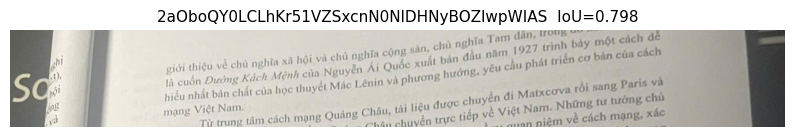

--- ground truth ---
Giới thiệu về chủ nghĩa xã hội và chủ nghĩa cộng sản, chủ nghĩa Tam dân là cuốn Đường Kách Mệnh của Nguyễn Ái Quốc xuất bản đầu năm 1927 trình bày một cách dễ hiểu nhất bản chất của học thuyết Mác Lênin và phương hướng yêu cầu phát triển cơ bản của cách mạng Việt Nam Từ trung tâm cách mạng Quảng Chây, tài liệu được chuyển đi Matxcơva rồi sang Paris và chuyển trực tiếp về Việt Nam. Những tư tưởng chú niệm về cách mạng xác



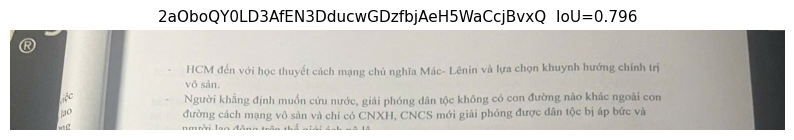

--- ground truth ---
HCM đến với học thuyết cách mạng chủ nghĩa Mác-Lênin và lựa chọn khuynh hướng chính trị vô sản.  Người khẳng định muốn cứu nước, giải phóng dân tộc không có con đường nào khác ngoài con đường cách mạng vô sản và chỉ có CNXH, CNCS mới giải phóng được dân tộc bị áp bức và



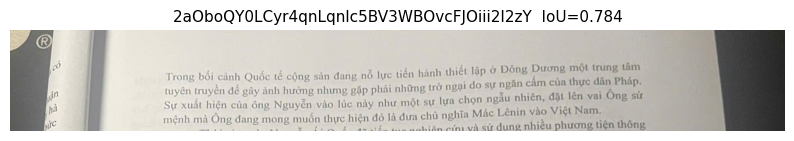

--- ground truth ---
Trong bối cảnh Quốc tế cộng sản đang nỗ lực tiến hành thiết lập ở Đông Dương một trung tâm tuyên truyền để gây ảnh hưởng nhung gặp phải những trở ngại do sự ngăn cấm của thực dân Pháp. Sự xuất hiện của ông Nguyễn vào kucs này như một sự lựa chọn ngẫu nhiên, đặt lên vai Ông sứ mệnh mà Ông đang mong muốn thực hiện đó là đưa chủ nghĩa Mác Lênin vào Vieeth Nam và sử dụng nhiều phương tiện thông



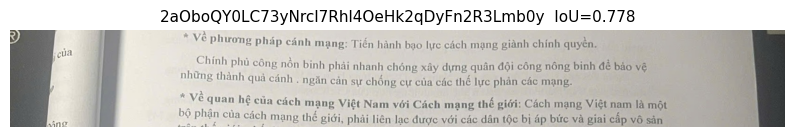

--- ground truth ---
Về phương pháp cách mạng: Tiến hành bạo lực cách mạng giành chính quyền Chính phủ công dồ binh phải nhanh chóng xây dựng quân đội công nông binh để bảo vệ những thành quả cánh ngăn cản sự chống cự của các thế lực phản cách mạng Về quan hệ của cách mạng Việt Nam bới Cách mạng thế giới: Cách mạng Việt Nam là một bộ phận của cách mạng thế giới, phải liên tục được với các dân tộc bị áp bức và giai cấp vô sản



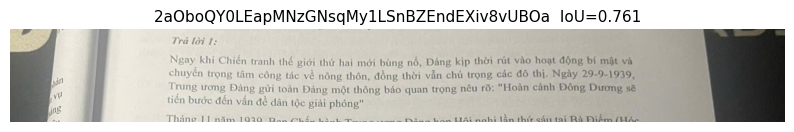

--- ground truth ---
Trả lời 1: Ngay khi Chiến tranh thế giới thứ hai mới bùng nổ, Đảng kịp thời rút vào hoạt động bí mật và chuyển trọng tâm công tác về nông thôn, đồng thời vẫn chú trọng các đô thị. Ngày 29-9-1939, trung ương Đảng gửi toàn Đảng một thông báo quan trọng nêu rõ: Hoàn cảnh Đông Dương sẽ tiến bước đến vấn đề dân tộc giải phóng



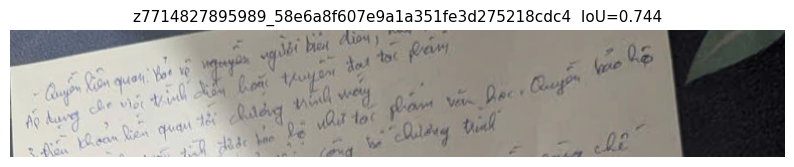

--- ground truth ---
Quyền liên quân: Bảo vệ nguyền người biểu Áp dụng cho một trình diễn hoặc truyền đạt tác phẩm Điều khoản kiên quan tới chương trình máy được bảo vệ như tác phẩm văn học. Quyền bảo hộ công bố chương trình



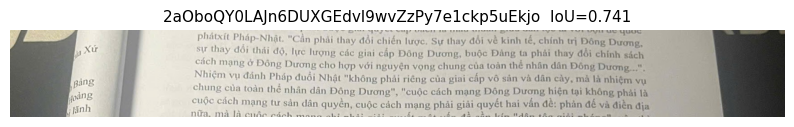

--- ground truth ---
Phátxí Pháp-Nhật. Cần thay đổi chiến lược. Sự thay đổi về kinh tế, chính trị Đông Dương. Sự thay đổi thái độ, lực lượng các giai cấp Đông Dương, buộc Đảng ta phải thay đổi chính sách cách mạng ở Đông Dương cho hợp với nguyện vọng chưng của toàn thể nhân dân Đông Dương... Nhiệm vụ đánh Pháp đuổi Nhật không phải riêng của giai cấp vô sản và dân cày, mà là nhiệm vụ chung của toàn thể nhân đân Đông Dương, cuộc cách mạng Đông Dương hiện tại không phải là cuộc cách mạng tư sản dân quyền, cuộc cách mạng phải giải quyết hai vấn đề: phản đề và điền địa



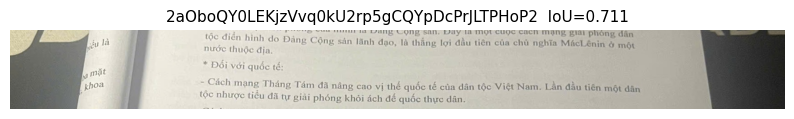

--- ground truth ---
Tộc điển hình do Đảng Cộng sản lãnh đạo, là thắng lợi đầu tiên của chủ nghĩa MácLênin ở nước thuộc địa Đối với quốc tế Cách mạng Tháng Tám đã nâng cao vị thế quốc tế của dân tộc Việt Nam. Lần đầu tiên một dân tộc nhược tiểu đã tự giải phòng khỏi ác đế quốc thực dân



In [ ]:
with open(OCR_GT_PATH, encoding='utf-8') as f:
    data = json.load(f)

for stem, info in data['items'].items():
    img = cv2.imread(str(WARPED_DIR / f'{stem}.jpg'))
    cropped, _ = crop_by_ratio(img, tuple(data['crop_region']))

    fig, ax = plt.subplots(figsize=(10, 4))
    ax.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
    iou_str = f"  IoU={info['iou']:.3f}" if info.get('iou') else ''
    ax.set_title(f'{stem}{iou_str}', fontsize=11)
    ax.axis('off')
    plt.show()
    print('--- ground truth ---')
    print(info['ground_truth'])
    print()